In [121]:
import scvelo as scv
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [122]:
import pickle

with open('./fig1-3.pkl', 'rb') as f:
    objects = pickle.load(f)

In [123]:
nPC = objects['nPC']
mPC = objects['mPC']
mPC_velo = objects['mPC_velo']

In [29]:
import numpy as np
from scipy import sparse
from sklearn.neighbors import NearestNeighbors
from scipy.stats import spearmanr

# 阶段1：计算celltype相似性（同上）
print("=== 阶段1：计算celltype相似性 ===")
nPC_celltypes = sorted(nPC.obs['celltype'].unique())
mPC_celltypes = sorted(mPC.obs['celltype'].unique())
common_genes = list(set(nPC.var_names) & set(mPC.var_names))

# 计算celltype平均表达谱
def compute_celltype_profiles(adata, celltypes, genes):
    profiles = {}
    for ct in celltypes:
        mask = adata.obs['celltype'] == ct
        ct_data = adata[mask, genes].X
        if sparse.issparse(ct_data):
            ct_data = ct_data.mean(axis=0).A1
        else:
            ct_data = ct_data.mean(axis=0)
        profiles[ct] = ct_data
    return profiles

nPC_profiles = compute_celltype_profiles(nPC, nPC_celltypes, common_genes)
mPC_profiles = compute_celltype_profiles(mPC, mPC_celltypes, common_genes)

# 计算相似性矩阵
similarity_matrix = np.zeros((len(mPC_celltypes), len(nPC_celltypes)))
for i, mpc_ct in enumerate(mPC_celltypes):
    for j, npc_ct in enumerate(nPC_celltypes):
        corr, _ = spearmanr(mPC_profiles[mpc_ct], nPC_profiles[npc_ct])
        similarity_matrix[i, j] = corr

# 匈牙利算法匹配
from scipy.optimize import linear_sum_assignment
cost_matrix = 1 - similarity_matrix
mpc_indices, npc_indices = linear_sum_assignment(cost_matrix)

celltype_mapping = {}
for mpc_idx, npc_idx in zip(mpc_indices, npc_indices):
    celltype_mapping[mPC_celltypes[mpc_idx]] = nPC_celltypes[npc_idx]

# 阶段2：分散映射（修正版本）
print("\n=== 阶段2：分散映射 ===")
nPC_umap = nPC.obsm['X_umap']
mPC_umap_dispersed = np.zeros((mPC.n_obs, nPC_umap.shape[1]))

# 首先，为每个nPC celltype计算UMAP的边界和密度
nPC_celltype_info = {}
for ct in nPC_celltypes:
    mask = nPC.obs['celltype'] == ct
    if np.sum(mask) > 0:
        ct_umap = nPC_umap[mask]
        # 计算边界
        min_coords = ct_umap.min(axis=0)
        max_coords = ct_umap.max(axis=0)
        center = ct_umap.mean(axis=0)
        
        nPC_celltype_info[ct] = {
            'indices': np.where(mask)[0],
            'umap_coords': ct_umap,
            'min': min_coords,
            'max': max_coords,
            'center': center,
            'density': ct_umap.shape[0] / ((max_coords - min_coords).prod() + 1e-6)
        }

# 对每个mPC celltype进行映射
for mpc_ct, npc_ct in celltype_mapping.items():
    print(f"\n处理: {mpc_ct} -> {npc_ct}")
    
    if npc_ct not in nPC_celltype_info:
        print(f"  跳过: nPC中没有{npc_ct}细胞")
        continue
    
    # 获取mPC中该类型的细胞
    mPC_mask = mPC.obs['celltype'] == mpc_ct
    mPC_indices = np.where(mPC_mask)[0]
    
    if len(mPC_indices) == 0:
        print(f"  跳过: mPC中没有{mpc_ct}细胞")
        continue
    
    mPC_ct_data = mPC[mPC_mask, common_genes].X
    
    # 获取对应的nPC信息
    npc_info = nPC_celltype_info[npc_ct]
    nPC_ct_indices = npc_info['indices']
    nPC_ct_umap = npc_info['umap_coords']
    
    if len(nPC_ct_indices) == 0:
        print(f"  跳过: nPC中没有{npc_ct}细胞")
        continue
    
    # 方法1：在nPC celltype内部进行kNN映射
    print(f"  mPC: {len(mPC_indices)}细胞, nPC: {len(nPC_ct_indices)}细胞")
    
    # 提取nPC对应celltype的数据
    nPC_ct_data = nPC[nPC_ct_indices, common_genes].X
    
    # 在nPC celltype内部进行kNN（使用余弦距离，适合稀疏矩阵）
    knn = NearestNeighbors(
        n_neighbors=min(10, nPC_ct_data.shape[0]), 
        metric='cosine'
    )
    
    # 确保数据格式正确
    if sparse.issparse(nPC_ct_data):
        knn.fit(nPC_ct_data.toarray())  # 小范围转稠密
    else:
        knn.fit(nPC_ct_data)
    
    # 分批处理mPC
    batch_size = 500
    for i in range(0, mPC_ct_data.shape[0], batch_size):
        end = min(i + batch_size, mPC_ct_data.shape[0])
        
        # 提取批次数据
        batch = mPC_ct_data[i:end]
        if sparse.issparse(batch):
            batch = batch.toarray()
        
        # 检查批次数据是否有效
        if batch.shape[0] == 0:
            continue
        
        try:
            # 获取最近邻
            distances, indices = knn.kneighbors(batch)
            
            # 确保indices有效
            if indices.max() >= len(nPC_ct_umap) or indices.min() < 0:
                print(f"    警告: 索引无效 ({indices.min()} ~ {indices.max()})，跳过批次")
                continue
            
            for j in range(batch.shape[0]):
                global_idx = mPC_indices[i + j]
                
                # 使用距离加权
                weights = np.exp(-distances[j])
                weights = weights / weights.sum()
                
                # 映射到UMAP空间（使用正确的索引）
                mapped_umap = np.sum(nPC_ct_umap[indices[j]] * weights[:, np.newaxis], axis=0)
                
                # 添加微小随机扰动
                scale = 0.03 * (npc_info['max'] - npc_info['min'])
                noise = np.random.normal(0, scale, size=mapped_umap.shape)
                mapped_umap += noise
                
                mPC_umap_dispersed[global_idx] = mapped_umap
            
            print(f"    批次 {i//batch_size + 1}: 处理 {batch.shape[0]} 细胞")
            
        except Exception as e:
            print(f"    批次 {i//batch_size + 1} 错误: {e}")
            # 使用简单方法：随机分配在celltype区域内
            for j in range(batch.shape[0]):
                global_idx = mPC_indices[i + j]
                # 在nPC celltype的UMAP范围内随机分配
                range_size = npc_info['max'] - npc_info['min']
                random_offset = np.random.rand(nPC_umap.shape[1]) * range_size
                mPC_umap_dispersed[global_idx] = npc_info['min'] + random_offset
    
    # 清理内存
    import gc
    gc.collect()

# 处理未映射的细胞（简化版）
unmapped_mask = np.all(mPC_umap_dispersed == 0, axis=1)
if np.any(unmapped_mask):
    print(f"\n处理 {np.sum(unmapped_mask)} 个未映射细胞...")
    
    # 简单方法：在整个nPC UMAP空间内随机分配
    nPC_umap_min = nPC_umap.min(axis=0)
    nPC_umap_max = nPC_umap.max(axis=0)
    range_size = nPC_umap_max - nPC_umap_min
    
    unmapped_indices = np.where(unmapped_mask)[0]
    for idx in unmapped_indices:
        random_coords = nPC_umap_min + np.random.rand(nPC_umap.shape[1]) * range_size
        mPC_umap_dispersed[idx] = random_coords

# 保存结果
mPC.obsm['X_umap_dispersed'] = mPC_umap_dispersed

=== 阶段1：计算celltype相似性 ===

=== 阶段2：分散映射 ===

处理: bd_cycling_like -> blood_cycling_plasmacell
  mPC: 688细胞, nPC: 290细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 188 细胞

处理: bd_end_like -> blood_end_plasmacell
  mPC: 617细胞, nPC: 396细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 117 细胞

处理: bd_highCXCR4_like -> blood_highCXCR4_plasmacell
  mPC: 6437细胞, nPC: 2014细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 500 细胞
    批次 3: 处理 500 细胞
    批次 4: 处理 500 细胞
    批次 5: 处理 500 细胞
    批次 6: 处理 500 细胞
    批次 7: 处理 500 细胞
    批次 8: 处理 500 细胞
    批次 9: 处理 500 细胞
    批次 10: 处理 500 细胞
    批次 11: 处理 500 细胞
    批次 12: 处理 500 细胞
    批次 13: 处理 437 细胞

处理: bd_lowCXCR4_like -> blood_lowCXCR4_plasmacell
  mPC: 1836细胞, nPC: 1133细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 500 细胞
    批次 3: 处理 500 细胞
    批次 4: 处理 336 细胞

处理: bd_pb_like -> blood_plasmablast
  mPC: 189细胞, nPC: 192细胞
    批次 1: 处理 189 细胞

处理: tn_cycling_like -> tonsil_cycling_plasmacell
  mPC: 52细胞, nPC: 49细胞
    批次 1: 处理 52 细胞

处理: tn_highCD74_like -> tonsil_highCD74_plasmacell
  mPC: 1

In [30]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt

# 1. 准备数据
# 为两个对象添加来源标识
nPC.obs['dataset'] = 'nPC (正常)'
mPC.obs['dataset'] = 'mPC (癌变)'

# 如果mPC已经有了映射的UMAP，使用它
if 'X_umap_dispersed' in mPC.obsm:
    mPC_umap_to_use = mPC.obsm['X_umap_dispersed']
    print("使用分散映射的UMAP")
else:
    mPC_umap_to_use = mPC.obsm.get('X_umap_mapped', mPC.obsm.get('X_umap_final', None))
    if mPC_umap_to_use is not None:
        print("使用其他映射的UMAP")
    else:
        print("mPC没有映射的UMAP，使用原始UMAP")
        mPC_umap_to_use = mPC.obsm['X_umap'] if 'X_umap' in mPC.obsm else None

# 2. 合并UMAP坐标
# 创建组合的UMAP坐标
combined_umap = np.vstack([nPC.obsm['X_umap'], mPC_umap_to_use])

# 创建组合的obs（元数据）
combined_obs = []
for obs in [nPC.obs, mPC.obs]:
    combined_obs.append(obs.reset_index(drop=True))
combined_obs = pd.concat(combined_obs, ignore_index=True)

# 3. 创建组合的AnnData对象（只用于可视化）
# 使用共同基因
common_genes = list(set(nPC.var_names) & set(mPC.var_names))
print(f"使用共同基因数: {len(common_genes)}")

# 提取表达矩阵
nPC_common = nPC[:, common_genes].X
mPC_common = mPC[:, common_genes].X

# 合并表达矩阵
from scipy import sparse
if sparse.issparse(nPC_common) and sparse.issparse(mPC_common):
    combined_X = sparse.vstack([nPC_common, mPC_common])
else:
    combined_X = np.vstack([nPC_common.toarray() if sparse.issparse(nPC_common) else nPC_common,
                           mPC_common.toarray() if sparse.issparse(mPC_common) else mPC_common])

# 创建组合对象
combined_adata = sc.AnnData(
    X=combined_X,
    obs=combined_obs,
    var=pd.DataFrame(index=common_genes)
)

# 添加UMAP坐标
combined_adata.obsm['X_umap'] = combined_umap

print(f"组合对象形状: {combined_adata.shape}")
print(f"nPC细胞数: {nPC.n_obs}")
print(f"mPC细胞数: {mPC.n_obs}")

使用分散映射的UMAP
使用共同基因数: 25394
组合对象形状: (22237, 25394)
nPC细胞数: 10000
mPC细胞数: 12237


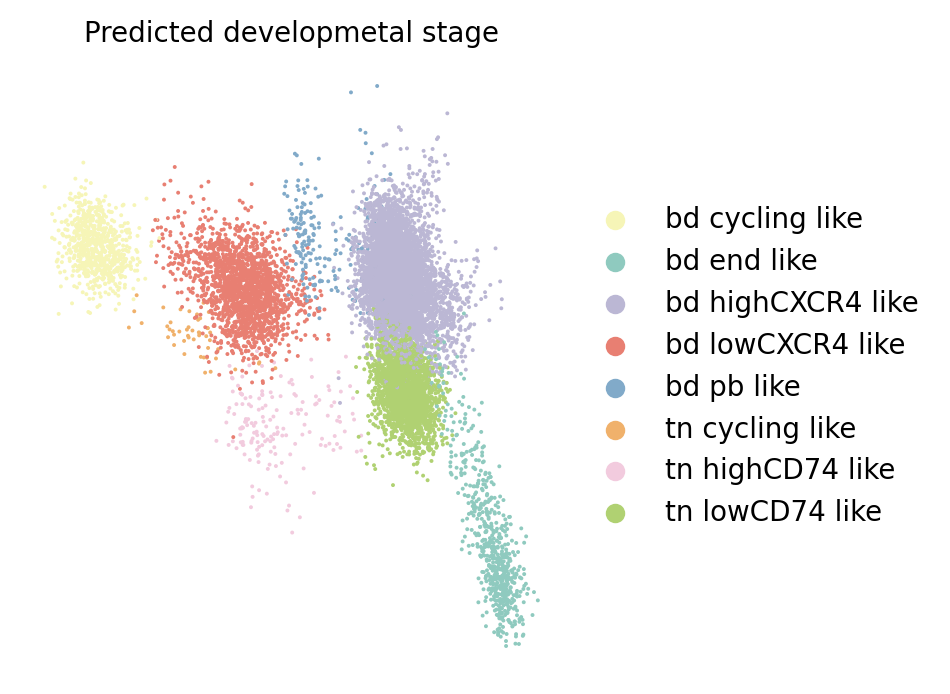

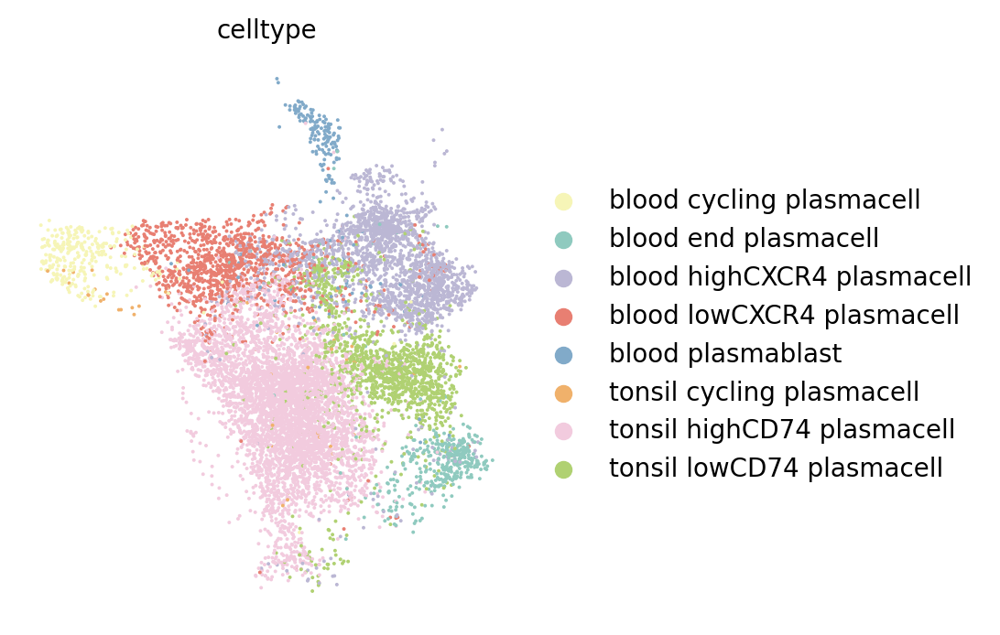

In [31]:
scv.pl.scatter(mPC,basis='umap_dispersed',color=['celltype'],title='Predicted developmetal stage',
               palette ={'bd_end_like':"#8fcabf",'bd_highCXCR4_like':"#bbb7d4",
                         "bd_lowCXCR4_like":"#e87f72","bd_pb_like":"#81aac9",
                         'bd_cycling_like':"#f6f5b7","tn_cycling_like":"#f0b16b",
                         "tn_lowCD74_like":"#b0d172","tn_highCD74_like":"#f2cbde"},
               legend_loc='right',
               figsize = (3.5,4),size=8)
color_map = {'blood_cycling_plasmacell': '#f6f5b7', 'blood_lowCXCR4_plasmacell': '#e87f72',
             'blood_highCXCR4_plasmacell': '#bbb7d4','blood_plasmablast': '#81aac9',
             'blood_end_plasmacell':'#8fcabf','tonsil_cycling_plasmacell':'#f0b16b',
             "tonsil_lowCD74_plasmacell":"#b0d172","tonsil_highCD74_plasmacell":"#f2cbde"}
scv.pl.scatter(nPC,color=['celltype'],basis='umap',palette=color_map,legend_loc='right',figsize = (3.5,4),size=8)

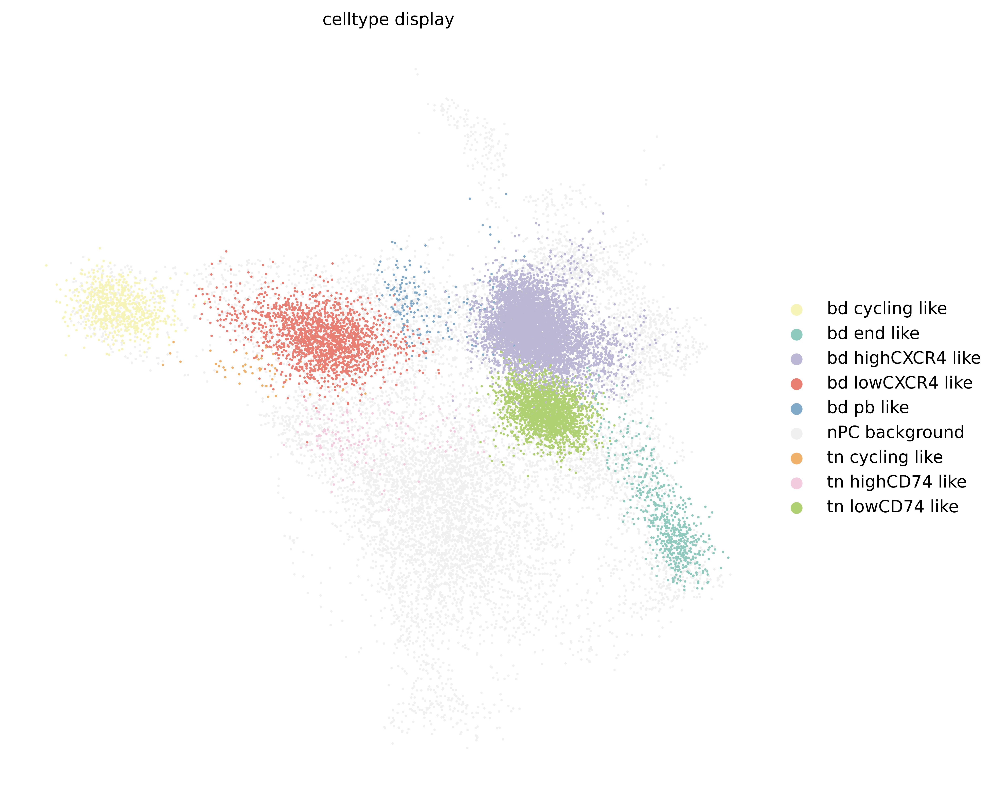

In [32]:
# 方法2：直接创建新列，不用copy categorical
combined_adata.obs['celltype_display'] = combined_adata.obs['celltype'].astype(str)  # 转为字符串

# 修改nPC细胞
nPC_mask = combined_adata.obs['dataset'] == 'nPC (正常)'
combined_adata.obs.loc[nPC_mask, 'celltype_display'] = 'nPC_background'
display_colors = {
    'bd_end_like': "#8fcabf",
    'bd_highCXCR4_like': "#bbb7d4",
    "bd_lowCXCR4_like": "#e87f72",
    "bd_pb_like": "#81aac9",
    'bd_cycling_like': "#f6f5b7",
    "tn_cycling_like": "#f0b16b",
    "tn_lowCD74_like": "#b0d172",
    "tn_highCD74_like": "#f2cbde",
    'nPC_background': '#f0f0f0'  # 浅灰色
}
# 绘制
scv.pl.scatter(combined_adata, 
               color=['celltype_display'], 
               basis='umap',dpi=300,
               palette=display_colors,
               legend_loc='right',
               figsize=(8, 8),
               size=8)

In [33]:
# 向量化方法
combined_adata.obs['state'] = 'Other'  # 默认值

# 设置不同状态
pt_str = combined_adata.obs['PT'].astype(str)

# Normal (NaN)
combined_adata.obs.loc[combined_adata.obs['PT'].isna(), 'state'] = 'Normal'

# ND (NDMM开头)
nd_mask = pt_str.str.startswith('NDMM')
combined_adata.obs.loc[nd_mask, 'state'] = 'ND'

# RR (RRMM开头)
rr_mask = pt_str.str.startswith('RRMM')
combined_adata.obs.loc[rr_mask, 'state'] = 'RR'

# SMM (SMM开头)
smm_mask = pt_str.str.startswith('SMM')
combined_adata.obs.loc[smm_mask, 'state'] = 'SMM'

# 检查
print("state分布:")
print(combined_adata.obs['state'].value_counts())

state分布:
Normal    10000
ND         7200
RR         3772
SMM        1265
Name: state, dtype: int64


In [99]:
# SMM1 pathological result shows lymphoplasmacytic proliferation, 
# removed in subsequent analysis
keep_indices = np.where(mPC.obs['PT'] != 'SMM1')[0]
mPC = mPC[keep_indices, :]

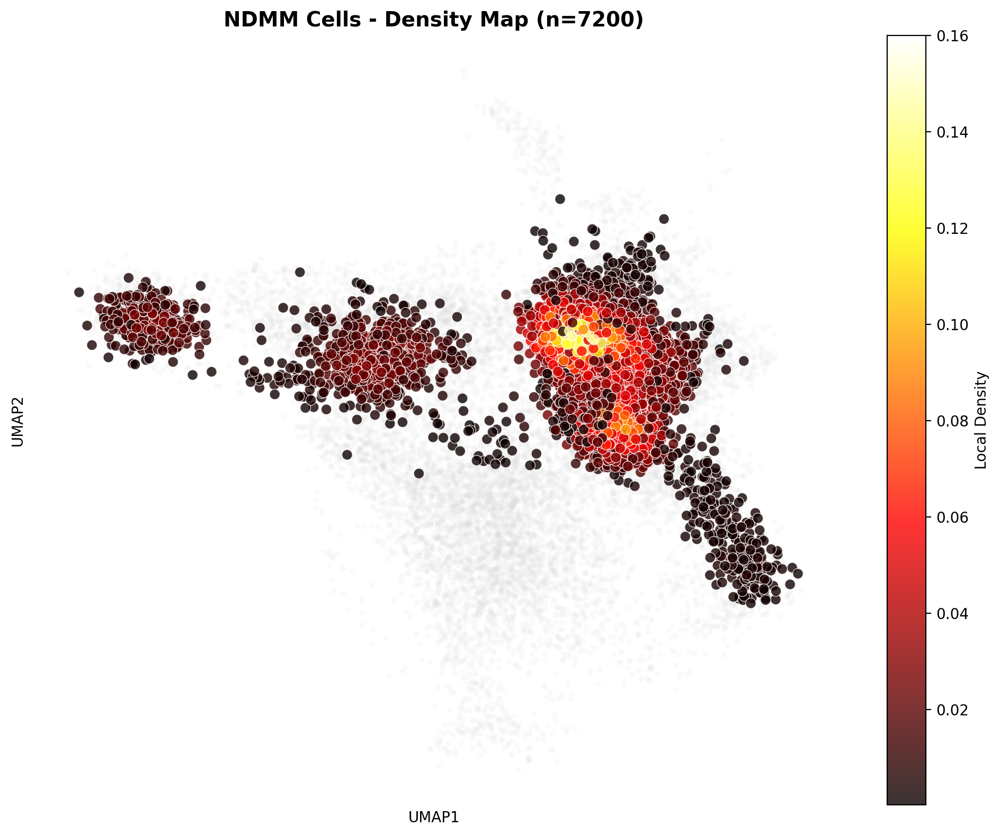

In [34]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# 创建图形，设置合适的尺寸
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# 获取SMM细胞的坐标
smm_mask = combined_adata.obs['state'] == 'ND'
smm_coords = combined_adata.obsm['X_umap'][smm_mask]

if smm_coords.shape[0] > 1:
    # 计算密度
    kde = gaussian_kde(smm_coords.T)
    density = kde(smm_coords.T)
    
    # 按密度着色，使用hot色图，设置vmax=0.16
    scatter = ax.scatter(smm_coords[:, 0], smm_coords[:, 1],
                         c=density, cmap='hot', s=50, vmax=0.16,
                         alpha=0.8, linewidths=0.5, edgecolor='white')
    
    # 添加颜色条
    cbar = plt.colorbar(scatter, ax=ax, label='Local Density')
    
    # 背景：所有其他细胞（很淡）
    ax.scatter(combined_adata.obsm['X_umap'][~smm_mask, 0],
               combined_adata.obsm['X_umap'][~smm_mask, 1],
               c='lightgray', s=15, alpha=0.1, linewidths=0, zorder=0)

# 设置标题
ax.set_title(f'NDMM Cells - Density Map (n={smm_mask.sum()})', fontsize=14, fontweight='bold')
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')

# 去除边框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# 移除网格和刻度
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

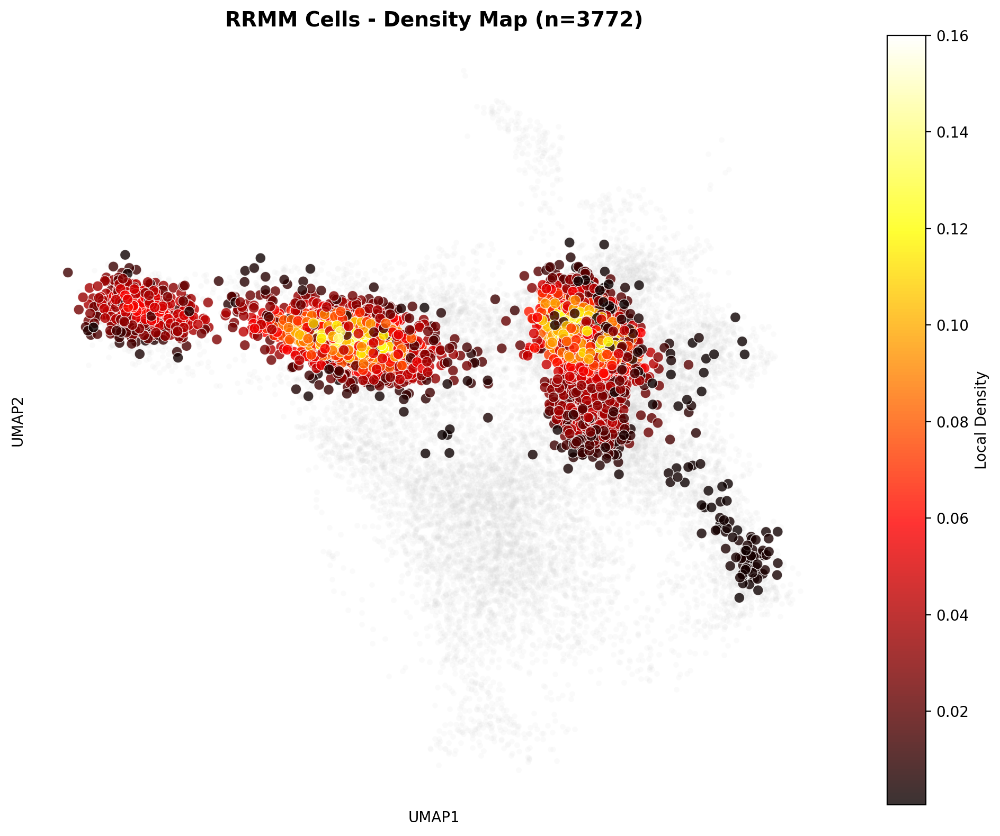

In [35]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# 创建图形，设置合适的尺寸
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# 获取SMM细胞的坐标
smm_mask = combined_adata.obs['state'] == 'RR'
smm_coords = combined_adata.obsm['X_umap'][smm_mask]

if smm_coords.shape[0] > 1:
    # 计算密度
    kde = gaussian_kde(smm_coords.T)
    density = kde(smm_coords.T)
    
    # 按密度着色，使用hot色图，设置vmax=0.16
    scatter = ax.scatter(smm_coords[:, 0], smm_coords[:, 1],
                         c=density, cmap='hot', s=50, vmax=0.16,
                         alpha=0.8, linewidths=0.5, edgecolor='white')
    
    # 添加颜色条
    cbar = plt.colorbar(scatter, ax=ax, label='Local Density')
    
    # 背景：所有其他细胞（很淡）
    ax.scatter(combined_adata.obsm['X_umap'][~smm_mask, 0],
               combined_adata.obsm['X_umap'][~smm_mask, 1],
               c='lightgray', s=15, alpha=0.1, linewidths=0, zorder=0)

# 设置标题
ax.set_title(f'RRMM Cells - Density Map (n={smm_mask.sum()})', fontsize=14, fontweight='bold')
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')

# 去除边框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# 移除网格和刻度
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

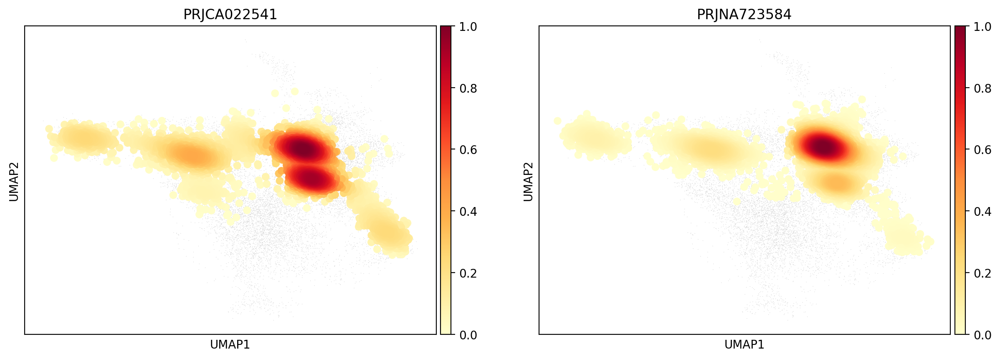

In [36]:
sc.tl.embedding_density(combined_adata, basis='umap',groupby='BioProject')
sc.pl.embedding_density(
    combined_adata,
    basis='umap',
    key='umap_density_BioProject',
    group=['PRJCA022541', 'PRJNA723584'],
    color_map='YlOrRd',
    bg_dotsize=1,  # 背景点大小
)

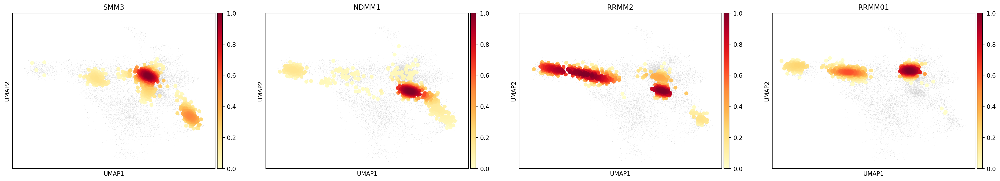

In [37]:
sc.tl.embedding_density(combined_adata, basis='umap',groupby='PT')
sc.pl.embedding_density(
    combined_adata,
    basis='umap',
    key='umap_density_PT',
    group=['SMM3', 'NDMM1', 'RRMM2', 'RRMM01'],
    color_map='YlOrRd',
    bg_dotsize=1,  # 背景点大小
)

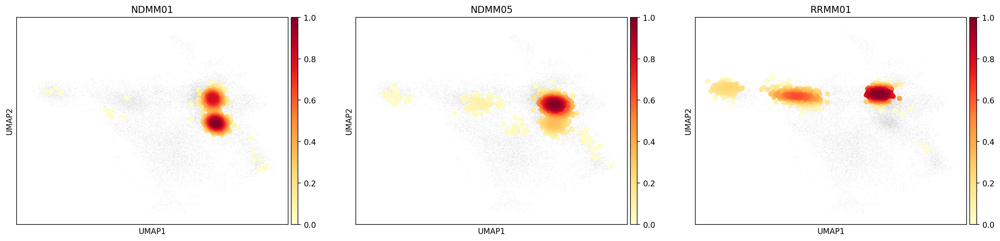

In [38]:
sc.pl.embedding_density(
    combined_adata,
    basis='umap',
    key='umap_density_PT',
    group=['NDMM01', 'NDMM05', 'RRMM01'],
    color_map='YlOrRd',
    bg_dotsize=1,  # 背景点大小
)

In [39]:
combined_adata.obs['CytoTRACE2_Potency']

0                   NaN
1                   NaN
2                   NaN
3                   NaN
4                   NaN
              ...      
22232       Oligopotent
22233    Differentiated
22234       Oligopotent
22235    Differentiated
22236    Differentiated
Name: CytoTRACE2_Potency, Length: 22237, dtype: category
Categories (4, object): ['Differentiated', 'Multipotent', 'Oligopotent', 'Unipotent']

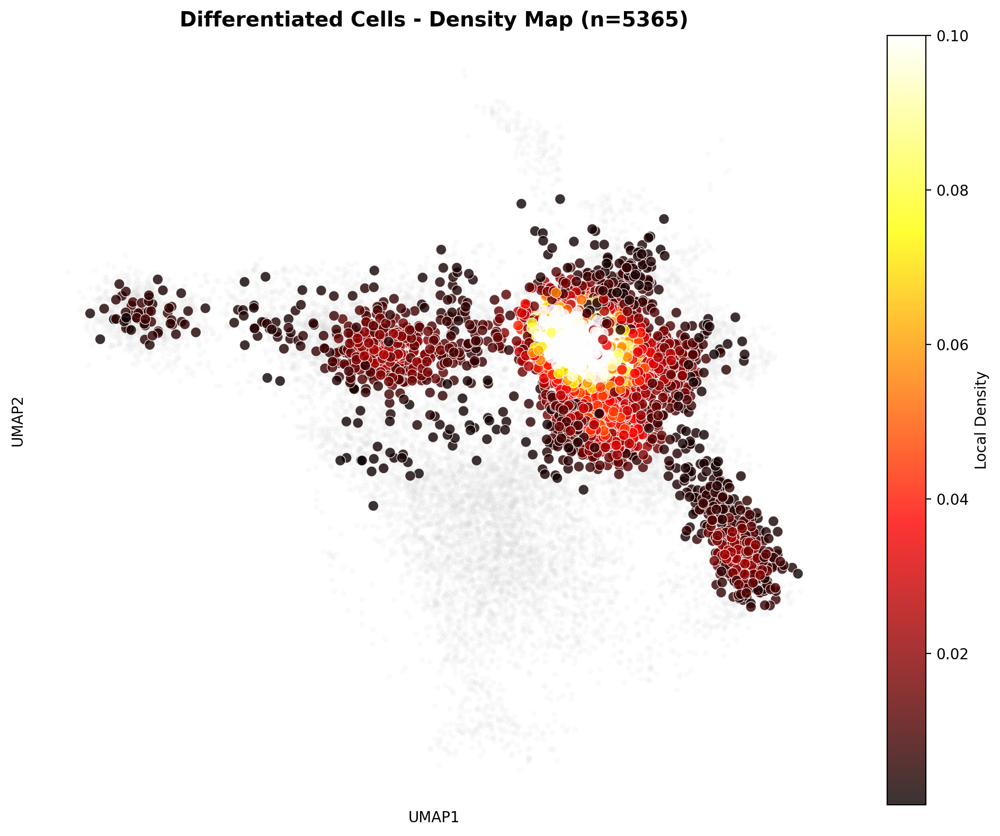

In [41]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# 创建图形，设置合适的尺寸
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# 获取SMM细胞的坐标
smm_mask = combined_adata.obs['CytoTRACE2_Potency'] == 'Differentiated'
smm_coords = combined_adata.obsm['X_umap'][smm_mask]

if smm_coords.shape[0] > 1:
    # 计算密度
    kde = gaussian_kde(smm_coords.T)
    density = kde(smm_coords.T)
    
    # 按密度着色，使用hot色图，设置vmax=0.16
    scatter = ax.scatter(smm_coords[:, 0], smm_coords[:, 1],
                         c=density, cmap='hot', s=50, vmax=0.1,
                         alpha=0.8, linewidths=0.5, edgecolor='white')
    
    # 添加颜色条
    cbar = plt.colorbar(scatter, ax=ax, label='Local Density')
    
    # 背景：所有其他细胞（很淡）
    ax.scatter(combined_adata.obsm['X_umap'][~smm_mask, 0],
               combined_adata.obsm['X_umap'][~smm_mask, 1],
               c='lightgray', s=15, alpha=0.1, linewidths=0, zorder=0)

# 设置标题
ax.set_title(f'Differentiated Cells - Density Map (n={smm_mask.sum()})', fontsize=14, fontweight='bold')
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')

# 去除边框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# 移除网格和刻度
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

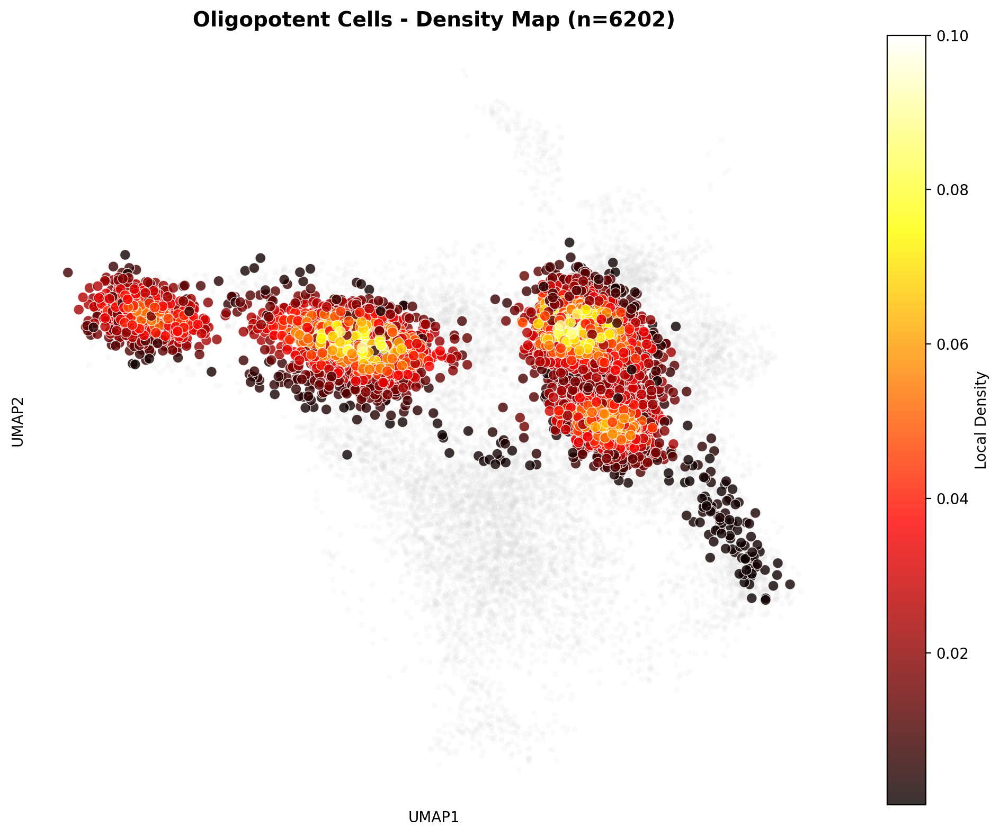

In [43]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# 创建图形，设置合适的尺寸
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# 获取SMM细胞的坐标
smm_mask = combined_adata.obs['CytoTRACE2_Potency'] == 'Oligopotent'
smm_coords = combined_adata.obsm['X_umap'][smm_mask]

if smm_coords.shape[0] > 1:
    # 计算密度
    kde = gaussian_kde(smm_coords.T)
    density = kde(smm_coords.T)
    
    # 按密度着色，使用hot色图，设置vmax=0.16
    scatter = ax.scatter(smm_coords[:, 0], smm_coords[:, 1],
                         c=density, cmap='hot', s=50, vmax=0.1,
                         alpha=0.8, linewidths=0.5, edgecolor='white')
    
    # 添加颜色条
    cbar = plt.colorbar(scatter, ax=ax, label='Local Density')
    
    # 背景：所有其他细胞（很淡）
    ax.scatter(combined_adata.obsm['X_umap'][~smm_mask, 0],
               combined_adata.obsm['X_umap'][~smm_mask, 1],
               c='lightgray', s=15, alpha=0.1, linewidths=0, zorder=0)

# 设置标题
ax.set_title(f'Oligopotent Cells - Density Map (n={smm_mask.sum()})', fontsize=14, fontweight='bold')
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')

# 去除边框
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# 移除网格和刻度
ax.grid(False)
ax.set_xticks([])
ax.set_yticks([])

plt.tight_layout()
plt.show()

In [124]:
mPC_velo1 = mPC_velo

In [125]:
mPC_velo = mPC_velo1

In [126]:
import numpy as np
from scipy import sparse
from sklearn.neighbors import NearestNeighbors
from scipy.stats import spearmanr

# 阶段1：计算celltype相似性（同上）
print("=== 阶段1：计算celltype相似性 ===")
nPC_celltypes = sorted(nPC.obs['celltype'].unique())
mPC_celltypes = sorted(mPC_velo.obs['celltype'].unique())
common_genes = list(set(nPC.var_names) & set(mPC_velo.var_names))

# 计算celltype平均表达谱
def compute_celltype_profiles(adata, celltypes, genes):
    profiles = {}
    for ct in celltypes:
        mask = adata.obs['celltype'] == ct
        ct_data = adata[mask, genes].X
        if sparse.issparse(ct_data):
            ct_data = ct_data.mean(axis=0).A1
        else:
            ct_data = ct_data.mean(axis=0)
        profiles[ct] = ct_data
    return profiles

nPC_profiles = compute_celltype_profiles(nPC, nPC_celltypes, common_genes)
mPC_profiles = compute_celltype_profiles(mPC_velo, mPC_celltypes, common_genes)

# 计算相似性矩阵
similarity_matrix = np.zeros((len(mPC_celltypes), len(nPC_celltypes)))
for i, mpc_ct in enumerate(mPC_celltypes):
    for j, npc_ct in enumerate(nPC_celltypes):
        corr, _ = spearmanr(mPC_profiles[mpc_ct], nPC_profiles[npc_ct])
        similarity_matrix[i, j] = corr

# 匈牙利算法匹配
from scipy.optimize import linear_sum_assignment
cost_matrix = 1 - similarity_matrix
mpc_indices, npc_indices = linear_sum_assignment(cost_matrix)

celltype_mapping = {}
for mpc_idx, npc_idx in zip(mpc_indices, npc_indices):
    celltype_mapping[mPC_celltypes[mpc_idx]] = nPC_celltypes[npc_idx]

# 阶段2：分散映射（修正版本）
print("\n=== 阶段2：分散映射 ===")
nPC_umap = nPC.obsm['X_umap']
mPC_umap_dispersed = np.zeros((mPC_velo.n_obs, nPC_umap.shape[1]))

# 首先，为每个nPC celltype计算UMAP的边界和密度
nPC_celltype_info = {}
for ct in nPC_celltypes:
    mask = nPC.obs['celltype'] == ct
    if np.sum(mask) > 0:
        ct_umap = nPC_umap[mask]
        # 计算边界
        min_coords = ct_umap.min(axis=0)
        max_coords = ct_umap.max(axis=0)
        center = ct_umap.mean(axis=0)
        
        nPC_celltype_info[ct] = {
            'indices': np.where(mask)[0],
            'umap_coords': ct_umap,
            'min': min_coords,
            'max': max_coords,
            'center': center,
            'density': ct_umap.shape[0] / ((max_coords - min_coords).prod() + 1e-6)
        }

# 对每个mPC celltype进行映射
for mpc_ct, npc_ct in celltype_mapping.items():
    print(f"\n处理: {mpc_ct} -> {npc_ct}")
    
    if npc_ct not in nPC_celltype_info:
        print(f"  跳过: nPC中没有{npc_ct}细胞")
        continue
    
    # 获取mPC中该类型的细胞
    mPC_mask = mPC_velo.obs['celltype'] == mpc_ct
    mPC_indices = np.where(mPC_mask)[0]
    
    if len(mPC_indices) == 0:
        print(f"  跳过: mPC中没有{mpc_ct}细胞")
        continue
    
    mPC_ct_data = mPC_velo[mPC_mask, common_genes].X
    
    # 获取对应的nPC信息
    npc_info = nPC_celltype_info[npc_ct]
    nPC_ct_indices = npc_info['indices']
    nPC_ct_umap = npc_info['umap_coords']
    
    if len(nPC_ct_indices) == 0:
        print(f"  跳过: nPC中没有{npc_ct}细胞")
        continue
    
    # 方法1：在nPC celltype内部进行kNN映射
    print(f"  mPC: {len(mPC_indices)}细胞, nPC: {len(nPC_ct_indices)}细胞")
    
    # 提取nPC对应celltype的数据
    nPC_ct_data = nPC[nPC_ct_indices, common_genes].X
    
    # 在nPC celltype内部进行kNN（使用余弦距离，适合稀疏矩阵）
    knn = NearestNeighbors(
        n_neighbors=min(10, nPC_ct_data.shape[0]), 
        metric='cosine'
    )
    
    # 确保数据格式正确
    if sparse.issparse(nPC_ct_data):
        knn.fit(nPC_ct_data.toarray())  # 小范围转稠密
    else:
        knn.fit(nPC_ct_data)
    
    # 分批处理mPC
    batch_size = 500
    for i in range(0, mPC_ct_data.shape[0], batch_size):
        end = min(i + batch_size, mPC_ct_data.shape[0])
        
        # 提取批次数据
        batch = mPC_ct_data[i:end]
        if sparse.issparse(batch):
            batch = batch.toarray()
        
        # 检查批次数据是否有效
        if batch.shape[0] == 0:
            continue
        
        try:
            # 获取最近邻
            distances, indices = knn.kneighbors(batch)
            
            # 确保indices有效
            if indices.max() >= len(nPC_ct_umap) or indices.min() < 0:
                print(f"    警告: 索引无效 ({indices.min()} ~ {indices.max()})，跳过批次")
                continue
            
            for j in range(batch.shape[0]):
                global_idx = mPC_indices[i + j]
                
                # 使用距离加权
                weights = np.exp(-distances[j])
                weights = weights / weights.sum()
                
                # 映射到UMAP空间（使用正确的索引）
                mapped_umap = np.sum(nPC_ct_umap[indices[j]] * weights[:, np.newaxis], axis=0)
                
                # 添加微小随机扰动
                scale = 0.03 * (npc_info['max'] - npc_info['min'])
                noise = np.random.normal(0, scale, size=mapped_umap.shape)
                mapped_umap += noise
                
                mPC_umap_dispersed[global_idx] = mapped_umap
            
            print(f"    批次 {i//batch_size + 1}: 处理 {batch.shape[0]} 细胞")
            
        except Exception as e:
            print(f"    批次 {i//batch_size + 1} 错误: {e}")
            # 使用简单方法：随机分配在celltype区域内
            for j in range(batch.shape[0]):
                global_idx = mPC_indices[i + j]
                # 在nPC celltype的UMAP范围内随机分配
                range_size = npc_info['max'] - npc_info['min']
                random_offset = np.random.rand(nPC_umap.shape[1]) * range_size
                mPC_umap_dispersed[global_idx] = npc_info['min'] + random_offset
    
    # 清理内存
    import gc
    gc.collect()

# 处理未映射的细胞（简化版）
unmapped_mask = np.all(mPC_umap_dispersed == 0, axis=1)
if np.any(unmapped_mask):
    print(f"\n处理 {np.sum(unmapped_mask)} 个未映射细胞...")
    
    # 简单方法：在整个nPC UMAP空间内随机分配
    nPC_umap_min = nPC_umap.min(axis=0)
    nPC_umap_max = nPC_umap.max(axis=0)
    range_size = nPC_umap_max - nPC_umap_min
    
    unmapped_indices = np.where(unmapped_mask)[0]
    for idx in unmapped_indices:
        random_coords = nPC_umap_min + np.random.rand(nPC_umap.shape[1]) * range_size
        mPC_umap_dispersed[idx] = random_coords

# 保存结果
mPC_velo.obsm['X_umap'] = mPC_umap_dispersed

=== 阶段1：计算celltype相似性 ===

=== 阶段2：分散映射 ===

处理: bd_cycling_like -> blood_cycling_plasmacell
  mPC: 2287细胞, nPC: 290细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 500 细胞
    批次 3: 处理 500 细胞
    批次 4: 处理 500 细胞
    批次 5: 处理 287 细胞

处理: bd_end_like -> blood_end_plasmacell
  mPC: 1436细胞, nPC: 396细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 500 细胞
    批次 3: 处理 436 细胞

处理: bd_highCXCR4_like -> blood_highCXCR4_plasmacell
  mPC: 32586细胞, nPC: 2014细胞
    批次 1: 处理 500 细胞
    批次 2: 处理 500 细胞
    批次 3: 处理 500 细胞
    批次 4: 处理 500 细胞
    批次 5: 处理 500 细胞
    批次 6: 处理 500 细胞
    批次 7: 处理 500 细胞
    批次 8: 处理 500 细胞
    批次 9: 处理 500 细胞
    批次 10: 处理 500 细胞
    批次 11: 处理 500 细胞
    批次 12: 处理 500 细胞
    批次 13: 处理 500 细胞
    批次 14: 处理 500 细胞
    批次 15: 处理 500 细胞
    批次 16: 处理 500 细胞
    批次 17: 处理 500 细胞
    批次 18: 处理 500 细胞
    批次 19: 处理 500 细胞
    批次 20: 处理 500 细胞
    批次 21: 处理 500 细胞
    批次 22: 处理 500 细胞
    批次 23: 处理 500 细胞
    批次 24: 处理 500 细胞
    批次 25: 处理 500 细胞
    批次 26: 处理 500 细胞
    批次 27: 处理 500 细胞
    批次 28: 处理 5

In [127]:
# SMM1 pathological result shows lymphoplasmacytic proliferation, 
# removed in subsequent analysis
keep_indices = np.where(mPC_velo.obs['PT'] != 'SMM1')[0]
mPC_velo = mPC_velo[keep_indices, :]

In [133]:
mPC_velo.obs['celltype'].value_counts()

bd_highCXCR4_like    32586
tn_lowCD74_like       6607
bd_lowCXCR4_like      6325
bd_cycling_like       2282
bd_end_like           1436
tn_highCD74_like       278
tn_cycling_like        202
bd_pb_like             193
Name: celltype, dtype: int64

In [136]:
mPC_velo.obs['celltype'] = mPC_velo.obs['celltype'].astype('category')

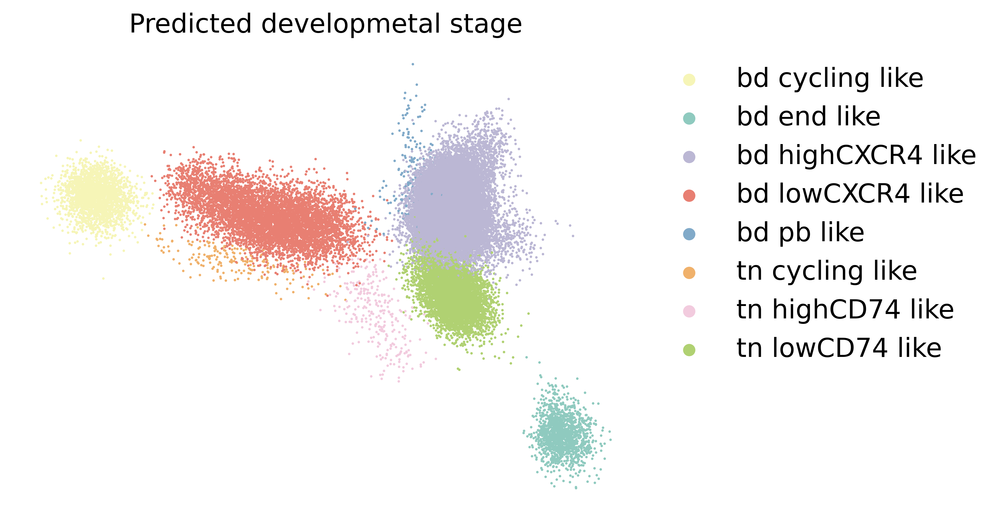

In [137]:
scv.pl.scatter(mPC_velo,basis='umap',legend_loc='upper right',color='celltype',
               legend_fontsize=15,title='Predicted developmetal stage',dpi=300,fontsize=15,
              palette ={'bd_end_like':"#8fcabf",'bd_highCXCR4_like':"#bbb7d4",
                         "bd_lowCXCR4_like":"#e87f72","bd_pb_like":"#81aac9",
                         'bd_cycling_like':"#f6f5b7","tn_cycling_like":"#f0b16b",
                         "tn_lowCD74_like":"#b0d172","tn_highCD74_like":"#f2cbde"},size=8)

In [138]:
sc.pp.highly_variable_genes(mPC_velo,n_top_genes=5000)
sc.tl.pca(mPC_velo)

In [139]:
scv.pp.moments(mPC_velo,n_pcs=30,n_neighbors=30)

Normalized count data: spliced, unspliced.
computing neighbors
    finished (0:00:07) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:02:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [140]:
#scv.tl.recover_dynamics(mPC_velo,n_jobs =8)

In [141]:
scv.tl.velocity(mPC_velo, 
     #          mode='dynamical'
               )

computing velocities
    finished (0:24:35) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [142]:
scv.tl.velocity_graph(mPC_velo)

computing velocity graph (using 1/8 cores)


  0%|          | 0/49909 [00:00<?, ?cells/s]

    finished (0:05:32) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [144]:
scv.tl.paga(mPC_velo, groups='celltype')

computing terminal states
    identified 10 regions of root cells and 6 regions of end points .
    finished (0:00:35) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:13) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)


In [149]:
import scanpy as sc
import pandas as pd
import numpy as np

# 设置随机种子以确保可重复性
np.random.seed(42)

# 获取所有细胞类型
celltypes = mPC_velo.obs['celltype'].unique()
sampled_indices = []

# 对每种细胞类型进行抽样
for ct in celltypes:
    # 获取该细胞类型的索引
    ct_indices = mPC_velo.obs[mPC_velo.obs['celltype'] == ct].index
    
    if len(ct_indices) >= 300:
        # 随机抽取300个，不重复
        sampled = np.random.choice(ct_indices, size=300, replace=False)
    else:
        # 不足300个，取全部
        sampled = ct_indices
        print(f"细胞类型 '{ct}' 只有 {len(ct_indices)} 个细胞，全部保留")
    
    sampled_indices.extend(sampled)

# 创建新的AnnData对象
sampled_adata = mPC_velo[sampled_indices].copy()

# 验证结果
print(f"原始数据: {mPC_velo.shape[0]} 个细胞")
print(f"抽样后: {sampled_adata.shape[0]} 个细胞")
print("\n细胞类型分布:")
print(sampled_adata.obs['celltype'].value_counts())

细胞类型 'tn_cycling_like' 只有 202 个细胞，全部保留
细胞类型 'tn_highCD74_like' 只有 278 个细胞，全部保留
细胞类型 'bd_pb_like' 只有 193 个细胞，全部保留
原始数据: 8109 个细胞
抽样后: 2173 个细胞

细胞类型分布:
bd_cycling_like      300
bd_end_like          300
bd_highCXCR4_like    300
bd_lowCXCR4_like     300
tn_lowCD74_like      300
tn_highCD74_like     278
tn_cycling_like      202
bd_pb_like           193
Name: celltype, dtype: int64


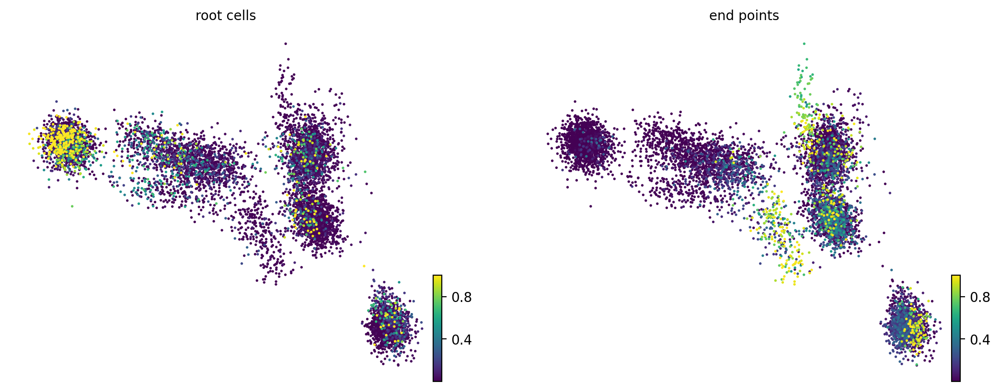

In [150]:
scv.pl.scatter(mPC_velo,color=['root_cells','end_points'], basis='umap',smooth=True)

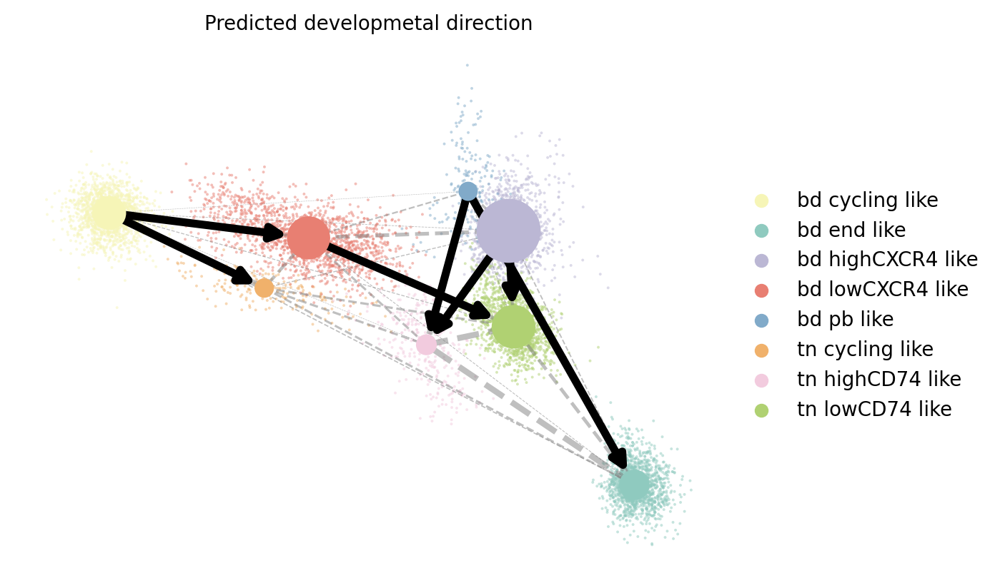

In [151]:
scv.pl.paga(mPC_velo, basis='umap', size=8, alpha=0.5,
            min_edge_width=4, node_size_scale=1.5,threshold=0.01,
           palette ={'bd_end_like':"#8fcabf",'bd_highCXCR4_like':"#bbb7d4",
                         "bd_lowCXCR4_like":"#e87f72","bd_pb_like":"#81aac9",
                         'bd_cycling_like':"#f6f5b7","tn_cycling_like":"#f0b16b",
                         "tn_lowCD74_like":"#b0d172","tn_highCD74_like":"#f2cbde"},
           title='Predicted developmetal direction')